In [1]:
%load_ext autoreload
%autoreload 2

In [3]:
### v9: multi-task training

import matplotlib.pyplot as plt
import numpy as np
import quaternions as Q
import torch
import torch.utils.data
import tqdm
import transformers
from demo_to_state_action_pairs import create_torch_dataset_v3
from get_data import generate_demos
from model_architectures import VisualPlanDiffuserV7
from visualization import visualize_2d_score_prediction
import pickle
import transformers
import grid_sampling
import inference
import visualization
from demo_to_state_action_pairs import create_labels_v3, CAMERAS as camera_names
import grid_sampling
from test_v9 import train
from demo_to_state_action_pairs import create_labels_v4

# demos = generate_demos("close_jar", 10)

# with open("replay_buffer/close_jar_10.pkl", "wb") as f:
#     pickle.dump(demos, f)

with open("replay_buffer/close_jar_10.pkl", "rb") as f:
    close_jar_demos = pickle.load(f)
    
with open("replay_buffer/open_drawer_8.pkl", "rb") as f:
    open_drawer_demos = pickle.load(f)
    
# with open("replay_buffer/light_bulb_in_10.pkl", "rb") as f:
#     light_bulb_in_demos = pickle.load(f)
    
with open("replay_buffer/meat_off_grill_10.pkl", "rb") as f:
    meat_off_grill_demos = pickle.load(f)

# train(demos[:1], epochs=5)

In [3]:
print("Loading checkpoints.")
device = torch.device("cuda")
clip = transformers.CLIPVisionModel.from_pretrained("openai/clip-vit-base-patch16")
model = VisualPlanDiffuserV7(clip).to(device)
model.load_state_dict(torch.load("diffusion_model.pt"))
print("Loaded checkpoints.")

Loading checkpoints.
Loaded checkpoints.


In [43]:
clip_processor = transformers.CLIPProcessor.from_pretrained("openai/clip-vit-base-patch16")

grid_size = 14
image_size = 224
with torch.no_grad():
    pixel_values = clip_processor(images=images[0], return_tensors="pt").pixel_values.cuda()
    pred = model(pixel_values).view(-1, grid_size, grid_size, 6).permute(0, 2, 1, 3)
    pred_direction = pred[..., 0:2].contiguous()
    pred_quat = pred[..., 2:6].contiguous()

    pred_direction_px = pred_direction * (image_size / 2)


Sampling keypoint.
Finished sampling keypoint.


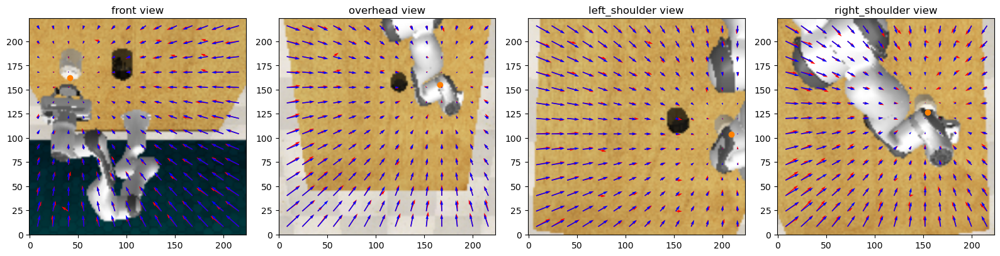

In [44]:
demo = demos[0]
tuples = create_labels_v3(demo)
(images, target_locations_2d, quaternions, info) = tuples[4]
extrinsics = info['extrinsics']
intrinsics = info['intrinsics']
target_locations_2d = torch.tensor(target_locations_2d, device=device)

print("Sampling keypoint.")
(history_3d, history_quaternions, history_2d_projections, predicted_score_maps, quat_maps) = \
    inference.sample_keypoint(model, images, extrinsics, intrinsics, (0.5, 0.5, 1.0))
print("Finished sampling keypoint.")

batch_size = len(images)
token_coordinates = grid_sampling.calculate_token_coordinates(224, 14, device=device)
token_coordinates_ = token_coordinates.unsqueeze(0).expand(batch_size, -1, -1, -1)
true_score_maps = target_locations_2d.view(batch_size, 1, 1, 2) - token_coordinates_

# plt.clf()
# plt.title("Score Function")
# visualization.visualize_2d_score_prediction(
#     images[0],
#     token_coordinates_[0].contiguous().view(-1, 2),
#     pred_direction_px[0].view(-1, 2),
#     true_score_maps[0].view(-1, 2),
# )
# plt.legend()

plt.figure(figsize=(16, 4))

visualization.visualize_2d_sampling_trajectory(
    images,
    token_coordinates,
    predicted_score_maps,
    true_score_maps,
    history_2d_projections,
    target_locations_2d,
    camera_names)

plt.tight_layout()
plt.show()


### testing virtual views

I unified the framework for virtual views and regular camera views. This will be *immensely* helpful when testing with IRL data!


/tmp/ipykernel_945035/3247333423.py:25: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  poses = (yz_pos, xz_pos, xy_pos) = renderer.point_location_on_images(torch.tensor(target_pos, device=device))


[[1.         0.         0.         0.19999999]
 [0.         1.         0.         0.        ]
 [0.         0.         1.         2.10000002]
 [0.         0.         0.         1.        ]]
[[224.   0. 112.]
 [  0. 224. 112.]
 [  0.   0.   1.]]
[ 0.27847567 -0.00816937  1.47196972]
(129, 110)
[129.5785532  110.17006117]


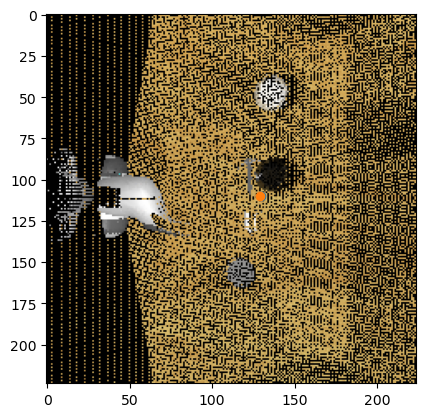

In [100]:
# visualize virtual views
import voxel_renderer_slow as V
from projections import make_projection

device = 'cuda'
renderer = V.VoxelRenderer(V.SCENE_BOUNDS, 224, torch.tensor([0, 0, 0], device=device), device)

CAMERAS = [
    'front',
    'overhead',
    'left_shoulder',
    'right_shoulder',
]

start_obs = demos[0][0]
target_pos = torch.tensor(start_obs.gripper_pose[:3], device=device)

pcds = [torch.tensor(getattr(start_obs, camera + '_point_cloud').reshape(-1, 3)) for camera in CAMERAS]
colors = [torch.tensor(getattr(start_obs, camera + '_rgb').reshape(-1, 3) / 255.0) for camera in CAMERAS]
pcd = torch.cat(pcds).to(device)
color = torch.cat(colors).to(device)

images = (yz_image, xz_image, xy_image) = renderer(pcd, color)

poses = (yz_pos, xz_pos, xy_pos) = renderer.point_location_on_images(torch.tensor(target_pos, device=device))

num = 2
camera_matrices = renderer.get_camera_matrices()
extrinsic, intrinsic = camera_matrices[num]

print(extrinsic)
print(intrinsic)
print(target_pos.cpu().numpy())
print(poses[num])

projection = make_projection(extrinsic, intrinsic, target_pos.cpu().numpy(), orthographic=True)

print(projection) # * 224 + 112

# render yz image
plt.imshow(images[num].cpu().numpy())
plt.scatter(*projection)
plt.scatter(*poses[num])
plt.show()

In [ ]:
from demo_to_state_action_pairs import create_labels_v4

print("Loading checkpoints.")
device = torch.device("cuda")
clip = transformers.CLIPVisionModel.from_pretrained("openai/clip-vit-base-patch16")
model = VisualPlanDiffuserV7(clip).to(device)
model.load_state_dict(torch.load("diffusion_model.pt"))
print("Loaded checkpoints.")

demo = demos[0]
original_tuples, virtual_tuples = create_labels_v4(demo)
(images, target_locations_2d, quaternions, info) = original_tuples[2]
extrinsics = info['extrinsics']
intrinsics = info['intrinsics']
target_locations_2d = torch.tensor(target_locations_2d, device=device)

print("Sampling keypoint.")
(history_3d, history_quaternions, history_2d_projections, predicted_score_maps, quat_maps) = \
    inference.sample_keypoint(model, images, extrinsics, intrinsics, (0.5, 0.5, 1.0))
print("Finished sampling keypoint.")

batch_size = len(images)
token_coordinates = grid_sampling.calculate_token_coordinates(image_size=224, grid_size=14, device=device)
true_score_maps = target_locations_2d.view(batch_size, 1, 1, 2) - token_coordinates.view(1, 14, 14, 2).expand(batch_size, -1, -1, -1)

plt.figure(figsize=(16, 4))

visualization.visualize_2d_sampling_trajectory(
    images,
    token_coordinates,
    predicted_score_maps,
    true_score_maps,
    history_2d_projections,
    target_locations_2d,
    camera_names,
)

plt.tight_layout()
plt.show()

### test training on virtual views with new framework

In [4]:
plt.rcParams['figure.dpi'] = 256

In [4]:
from get_data import generate_demos
import pickle

light_bulb_in_demos = generate_demos("light_bulb_in", 10)

with open("replay_buffer/light_bulb_in_10.pkl", "wb") as f:
    pickle.dump(light_bulb_in_demos, f)


QStandardPaths: XDG_RUNTIME_DIR not set, defaulting to '/tmp/runtime-gsk6me'


Generating demos...
Finished generating demos. Took 46.2469 seconds.


In [5]:
close_jar_demos_train = close_jar_demos[:6]
open_drawer_demos_train = open_drawer_demos[:6]
close_jar_demos_test = close_jar_demos[6:8]
open_drawer_demos_test = open_drawer_demos[6:8]
meat_off_grill_demos_train = meat_off_grill_demos[:6]
meat_off_grill_demos_test = meat_off_grill_demos[6:8]
light_bulb_in_demos_train = light_bulb_in_demos[:6]
light_bulb_in_demos_test = light_bulb_in_demos[6:8]

2024-03-26 22:19:16.257814: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-03-26 22:19:17.551508: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


Freezing first 0 layers out of 12
[CoppeliaSim:loadinfo]   done.


100%|██████████| 12/12 [00:03<00:00,  3.52it/s, loss=0.00492, quat_loss=2.09e-5, score_loss=0.00282]


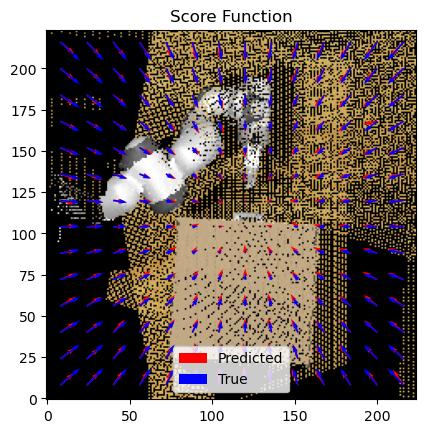

In [7]:
device='cuda'
clip = transformers.CLIPVisionModel.from_pretrained("openai/clip-vit-base-patch16")
model = VisualPlanDiffuserV7(clip).to(device)
# model.load_state_dict(torch.load("diffusion_model.pt"))

train(light_bulb_in_demos_train + open_drawer_demos_train, epochs=25, model=model, include_original=False, include_virtual=True)

Sampling keypoint.
Finished sampling keypoint.


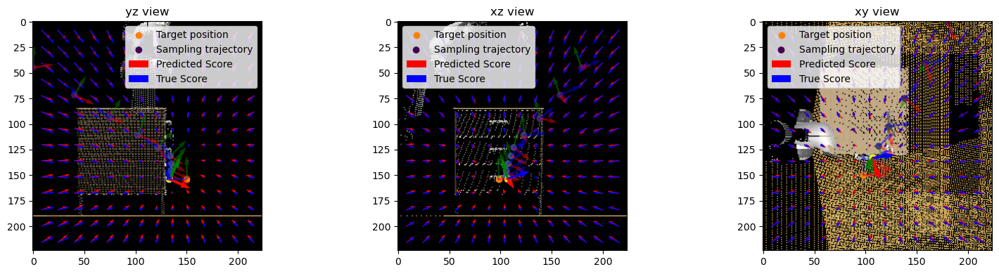

Sampling keypoint.
Finished sampling keypoint.


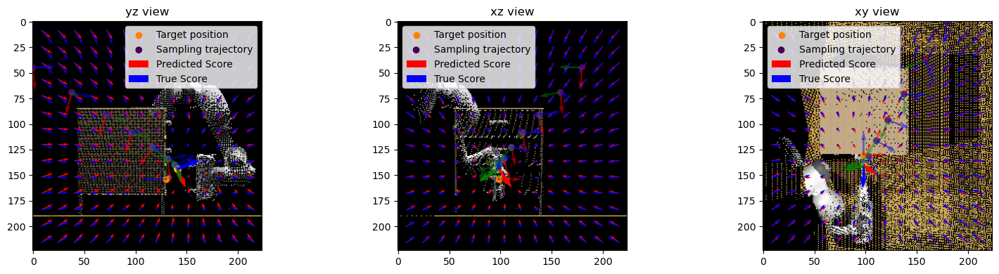

Sampling keypoint.
Finished sampling keypoint.


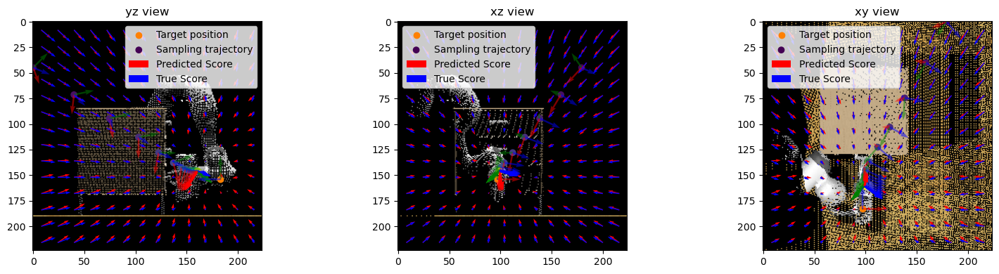

In [13]:
demo = open_drawer_demos_test[0]
original_tuples, virtual_tuples = create_labels_v4(demo)

for i in range(len(original_tuples)):
    (images, target_locations_2d, quaternions, info) = virtual_tuples[i]
    extrinsics = info['extrinsics']
    intrinsics = info['intrinsics']
    projection_types = info['projection_types']
    target_quat = info['target_quaternion']
    target_locations_2d = torch.tensor(target_locations_2d, device=device)

    print("Sampling keypoint.")
    (history_3d, history_quaternions, history_2d_projections, predicted_score_maps, quat_maps) = \
        inference.sample_keypoint(model, images, extrinsics, intrinsics, projection_types, (0.5, -0.5, 1.4))
    print("Finished sampling keypoint.")

    batch_size = len(images)
    token_coordinates = grid_sampling.calculate_token_coordinates(image_size=224, grid_size=14, device=device)
    true_score_maps = target_locations_2d.view(batch_size, 1, 1, 2) - token_coordinates.view(1, 14, 14, 2).expand(batch_size, -1, -1, -1)

    plt.figure(figsize=(16, 4))

    visualization.visualize_2d_sampling_trajectory(
        images,
        token_coordinates,
        predicted_score_maps,
        true_score_maps,
        history_2d_projections,
        history_quaternions,
        target_quat,
        extrinsics,
        target_locations_2d,
        # camera_names,
        ["yz", "xz", "xy"],
    )

    plt.tight_layout()
    plt.show()

In [101]:
import matplotlib.pyplot as plt
import numpy as np
import quaternions as Q
import torch
import torch.utils.data
import tqdm
import transformers
from demo_to_state_action_pairs import create_torch_dataset_v3
from get_data import generate_demos
from model_architectures import VisualPlanDiffuserV7
from visualization import visualize_2d_score_prediction
import pickle
import transformers
import grid_sampling
import inference
import visualization
from demo_to_state_action_pairs import create_labels_v3, CAMERAS as camera_names
import grid_sampling

def freeze_clip_layers(clip, first_n=0):
    for i in range(first_n):
        clip.vision_model.encoder.layers[i].requires_grad_(False)
    print(f"Freezing first {first_n} layers out of {len(clip.vision_model.encoder.layers)}")
    
def annihilate_mlp_parameters(model):
    for name, param in model.named_parameters():
        # check if MLP
        if "linear" in name and ('.weight' in name or '.bias' in name):
            param.data.fill_(0)

def train_2(demos, epochs=10):
    device = torch.device('cuda')

    clip = transformers.CLIPVisionModel.from_pretrained("openai/clip-vit-base-patch16").to(device) # type: ignore
    clip_processor = transformers.CLIPProcessor.from_pretrained("openai/clip-vit-base-patch16") # type: ignore
    model = VisualPlanDiffuserV7(clip).to(device)

    freeze_clip_layers(clip, first_n=0)
    # annihilate_mlp_parameters(model)

    optim = torch.optim.Adam([p for p in model.parameters() if p.requires_grad], lr=1e-5)

    # Generates (image, position, quaternion) triplets
    dataset = create_torch_dataset_v3(demos, device=device)
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=16, shuffle=False)
    
    # We predict the direction of the keypoint from *these* pixel locations.
    # These are the 2D coordinates of each token, in pixel space.
    image_size = 224
    grid_size = 14
    token_coordinates = grid_sampling.calculate_token_coordinates(image_size, grid_size, device=device)

    for epoch in range(epochs):
        for (image, position, quat) in (pbar := tqdm.tqdm(dataloader)):
            pixel_values = clip_processor(images=image, return_tensors="pt", do_rescale=False).to(device=device).pixel_values # type: ignore
            
            # Unsqueeze for this particular batch
            token_coordinates_ = token_coordinates.unsqueeze(0).expand(position.shape[0], -1, -1, -1)
            position_ = position.view(-1, 1, 1, 2)

            true_direction = (position_ - token_coordinates_)
            true_direction_scaled = true_direction / (image_size / 2)
            
            # (batch, token_y, token_x, 2) -> (batch, token_x, token_y, 2)
            pred = model(pixel_values).view(-1, grid_size, grid_size, 6).permute(0, 2, 1, 3)
            pred_direction = pred[..., 0:2].contiguous()
            pred_quat = pred[..., 2:6].contiguous()
            
            pred_direction_px = pred_direction * (image_size / 2)

            score_loss = (pred_direction - true_direction_scaled).pow(2).mean()
            
            # Weighted average based on distance to keypoint.
            distances = (token_coordinates_ - position_).norm(dim=-1, keepdim=True)
            quat_loss_weighting = torch.exp(-distances / 0.1)
            quat_loss_weighting = quat_loss_weighting / quat_loss_weighting.sum(dim=(1, 2, 3), keepdim=True)
            quat = quat.view(-1, 1, 1, 4)
            quat_loss = ((pred_quat - quat).pow(2) * quat_loss_weighting).mean()

            quat_loss_coeff = 10
            loss = score_loss + quat_loss_coeff * quat_loss

            optim.zero_grad()
            loss.backward()
            optim.step()
            
            pbar.set_postfix({"loss": loss.item(), "quat_loss": quat_loss.item(), "score_loss": score_loss.item()})
        
        tuples = create_labels_v3(demo)
        (images, target_locations_2d, quaternions, info) = tuples[4]
        extrinsics = info['extrinsics']
        intrinsics = info['intrinsics']
        target_locations_2d = torch.tensor(target_locations_2d, device=device)

        print("Sampling keypoint.")
        (history_3d, history_quaternions, history_2d_projections, predicted_score_maps, quat_maps) = \
            inference.sample_keypoint(model, images, extrinsics, intrinsics, (0.5, 0.5, 1.0))
        print("Finished sampling keypoint.")

        batch_size = len(images)
        # token_coordinates = grid_sampling.calculate_token_coordinates(image_size=224, grid_size=14, device=device)
        # true_score_maps = target_locations_2d.view(batch_size, 1, 1, 2) - token_coordinates.view(1, 14, 14, 2).expand(batch_size, -1, -1, -1)
        
        pixel_values = clip_processor(images=image, return_tensors="pt", do_rescale=False).to(device=device).pixel_values
        pred = model(pixel_values).view(-1, grid_size, grid_size, 6).permute(0, 2, 1, 3)
        pred_direction = pred[..., 0:2].contiguous()
        pred_quat = pred[..., 2:6].contiguous()

        plt.figure(figsize=(16, 4))
        visualization.visualize_2d_sampling_trajectory(
            images,
            token_coordinates,
            predicted_score_maps,
            true_score_maps,
            history_2d_projections,
            target_locations_2d,
            camera_names)
        plt.tight_layout()
        plt.show()

        # Visualize the vector field
        plt.clf()
        plt.title("Score Function 0")
        visualize_2d_score_prediction(
            image[0],
            token_coordinates.view(-1, 2),
            (pred_direction[0] * 224/2).view(-1, 2),
            true_direction[0].view(-1, 2),
        )
        plt.legend()
        plt.show()
        
        # Visualize the vector field
        plt.clf()
        plt.title("Score Function")
        visualize_2d_score_prediction(
            image[0],
            token_coordinates.view(-1, 2),
            pred_direction_px[0].view(-1, 2),
            true_direction[0].view(-1, 2),
        )
        plt.legend()
        plt.show()


Freezing first 0 layers out of 12


100%|██████████| 2/2 [00:00<00:00,  3.68it/s, loss=0.699, quat_loss=0.00152, score_loss=0.683]


Sampling keypoint.
Finished sampling keypoint.


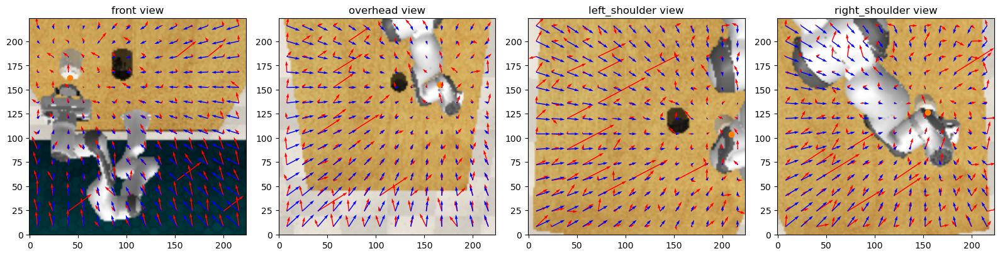

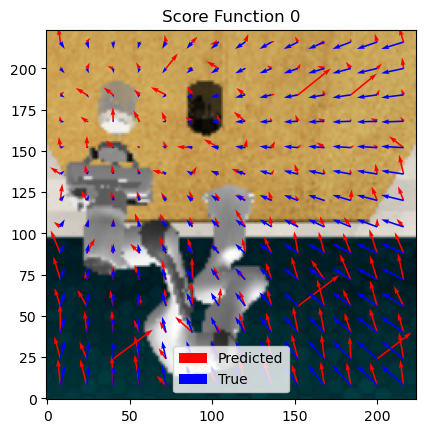

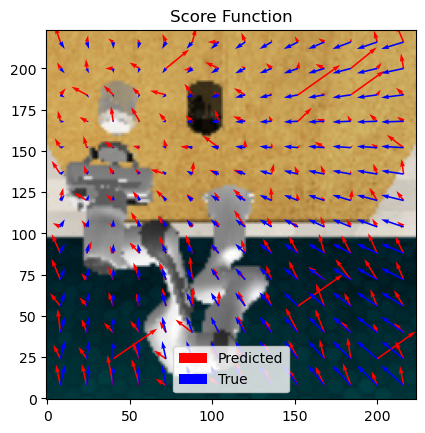

100%|██████████| 2/2 [00:00<00:00,  3.92it/s, loss=0.399, quat_loss=0.00104, score_loss=0.389]


Sampling keypoint.
Finished sampling keypoint.


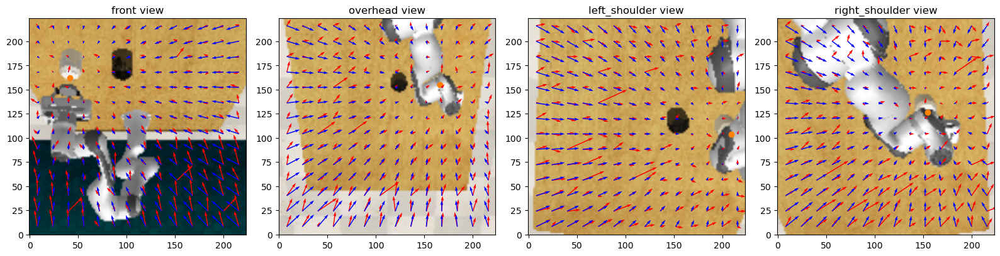

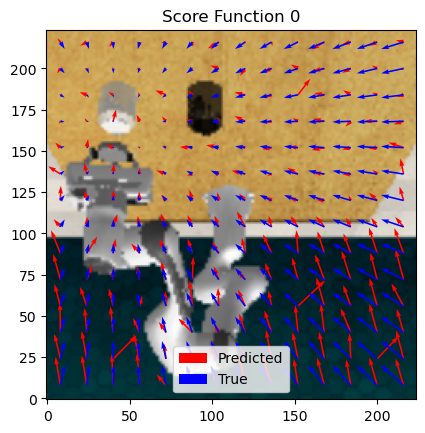

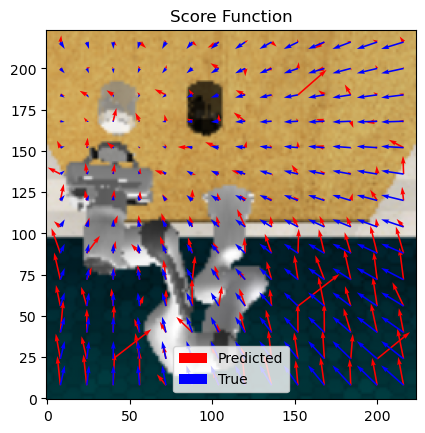

100%|██████████| 2/2 [00:00<00:00,  3.83it/s, loss=0.253, quat_loss=0.000719, score_loss=0.246]


Sampling keypoint.
Finished sampling keypoint.


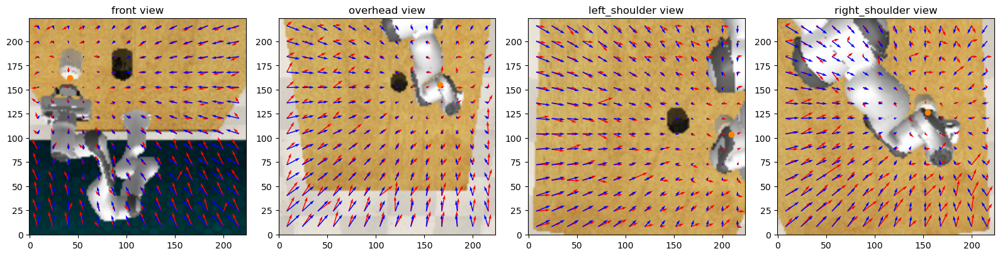

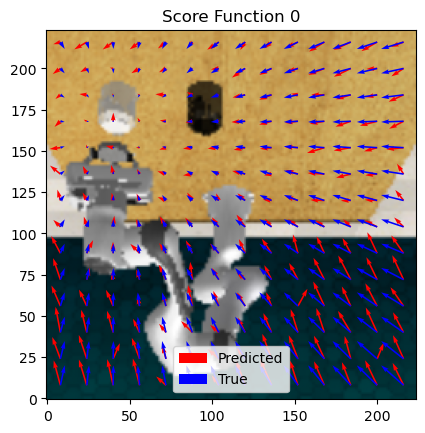

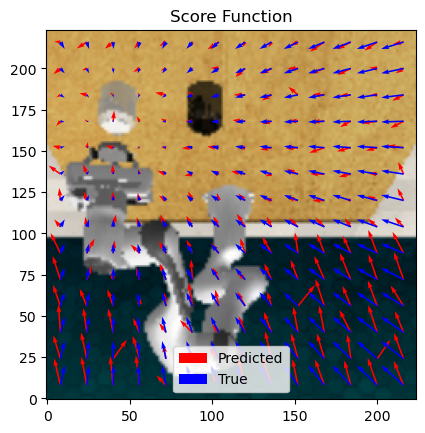

100%|██████████| 2/2 [00:00<00:00,  3.85it/s, loss=0.158, quat_loss=0.000548, score_loss=0.152]


Sampling keypoint.
Finished sampling keypoint.


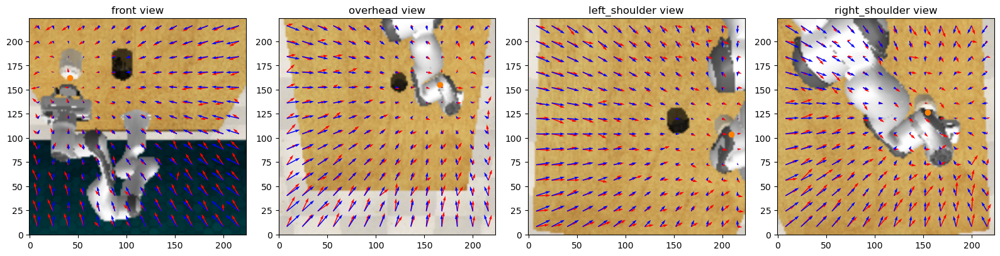

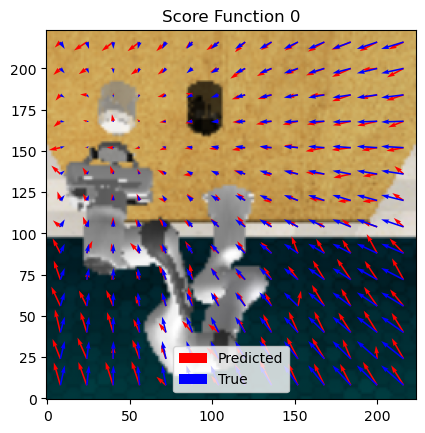

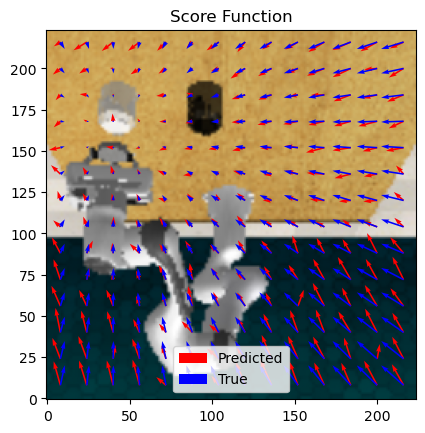

100%|██████████| 2/2 [00:00<00:00,  3.68it/s, loss=0.111, quat_loss=0.000419, score_loss=0.107]


Sampling keypoint.
Finished sampling keypoint.


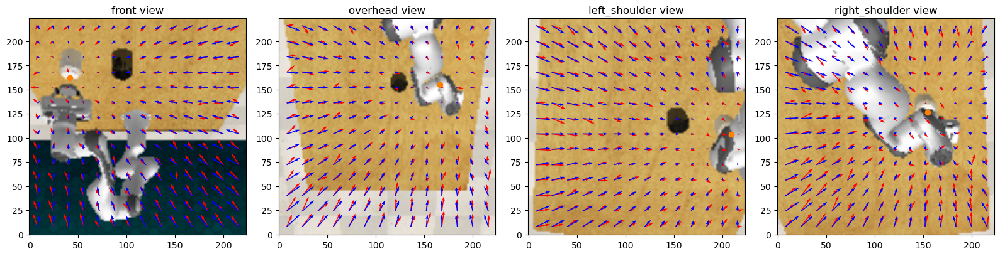

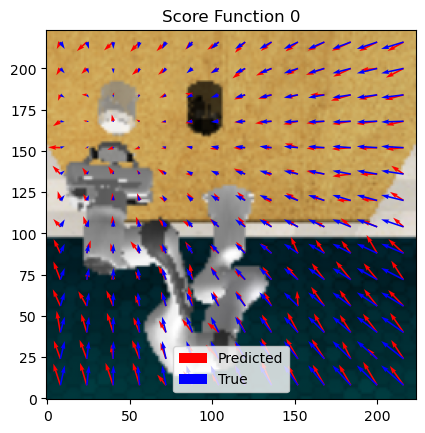

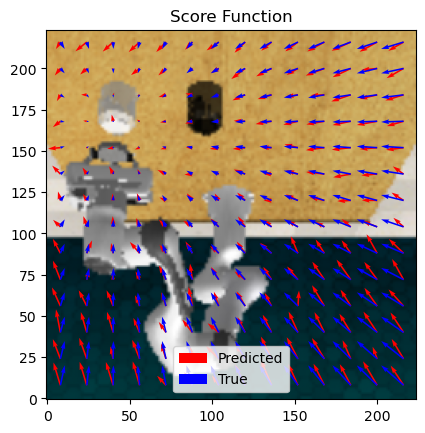

100%|██████████| 2/2 [00:00<00:00,  3.68it/s, loss=0.0811, quat_loss=0.00031, score_loss=0.078]


Sampling keypoint.
Finished sampling keypoint.


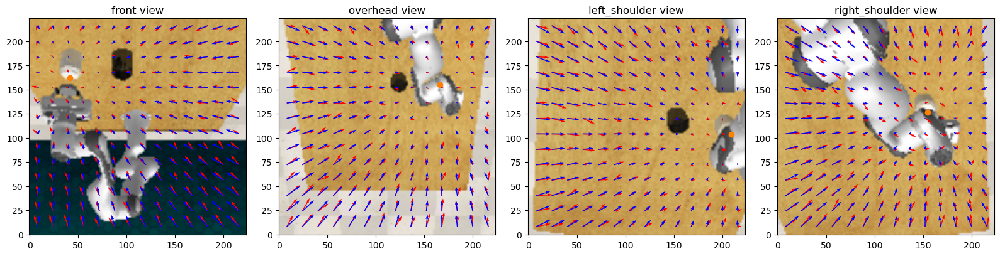

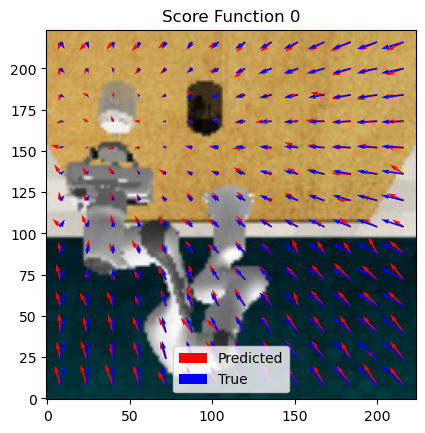

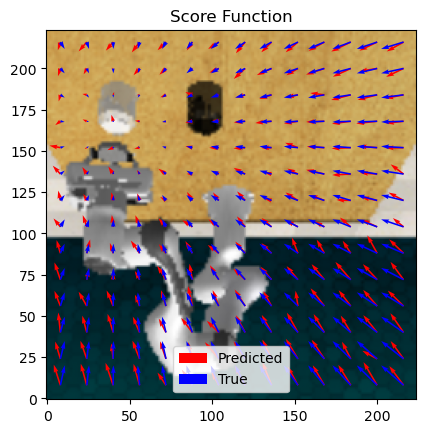

100%|██████████| 2/2 [00:00<00:00,  3.65it/s, loss=0.0586, quat_loss=0.000255, score_loss=0.056]


Sampling keypoint.
Finished sampling keypoint.


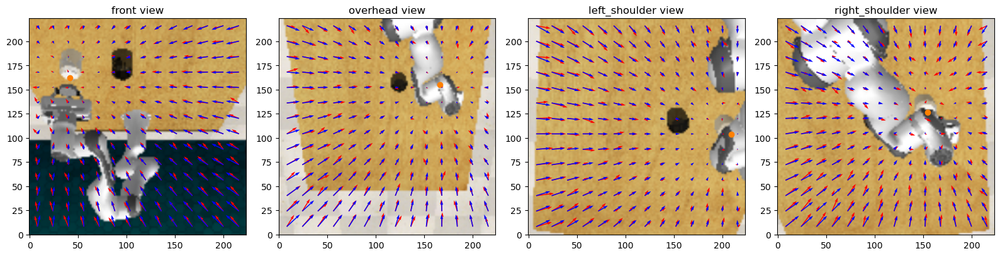

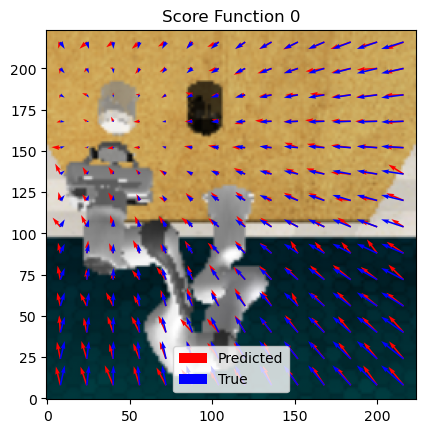

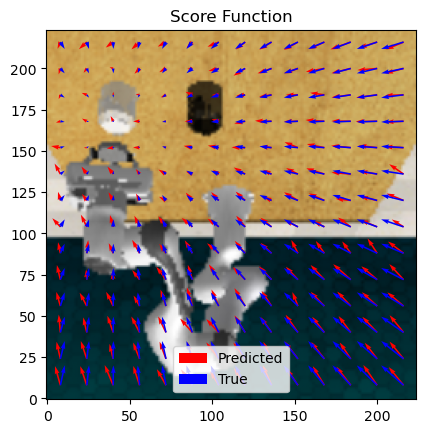

100%|██████████| 2/2 [00:00<00:00,  3.73it/s, loss=0.0442, quat_loss=0.000199, score_loss=0.0422]


Sampling keypoint.
Finished sampling keypoint.


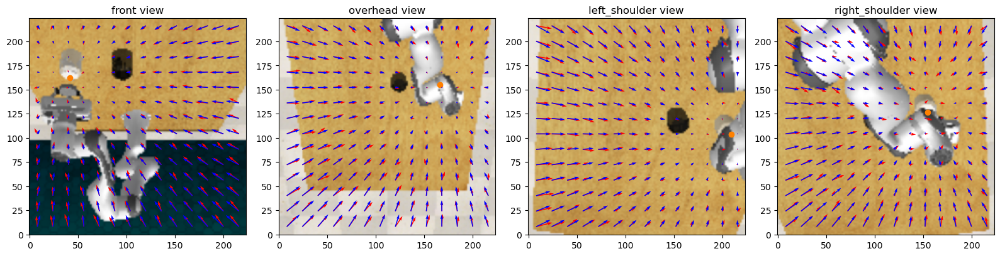

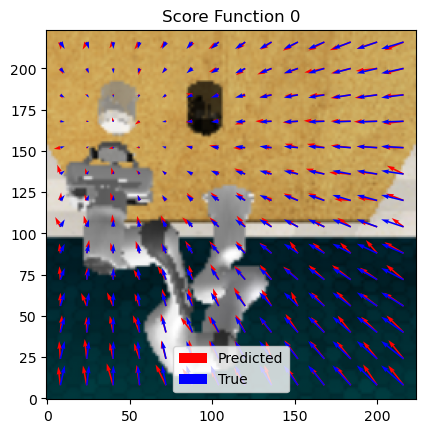

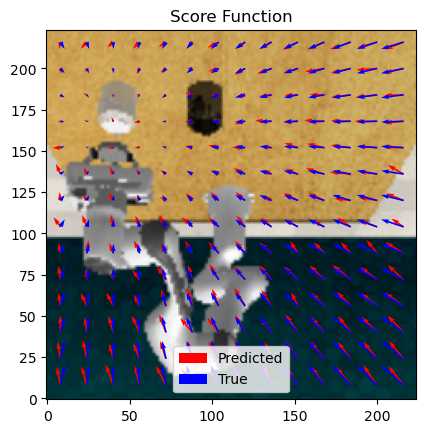

100%|██████████| 2/2 [00:00<00:00,  3.79it/s, loss=0.0357, quat_loss=0.000137, score_loss=0.0344]


Sampling keypoint.
Finished sampling keypoint.


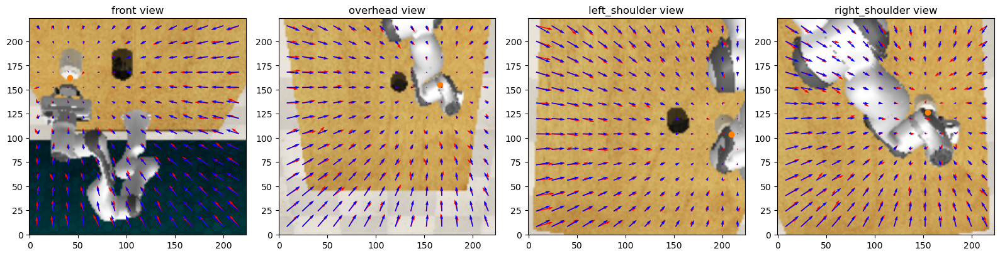

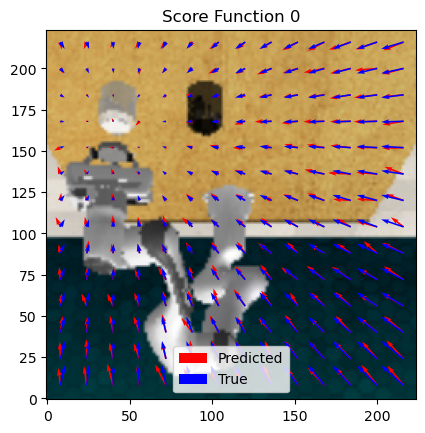

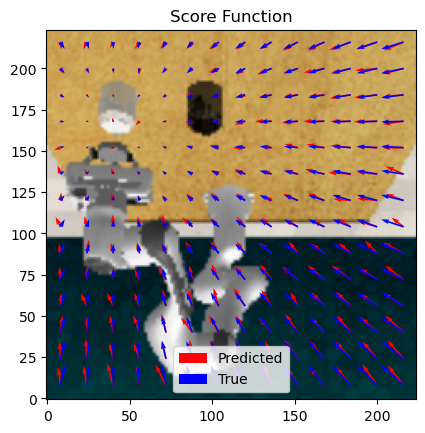

100%|██████████| 2/2 [00:00<00:00,  3.72it/s, loss=0.0306, quat_loss=8.13e-5, score_loss=0.0298] 


Sampling keypoint.
Finished sampling keypoint.


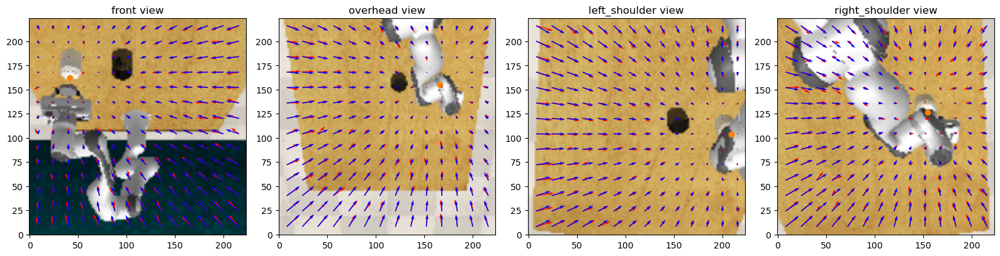

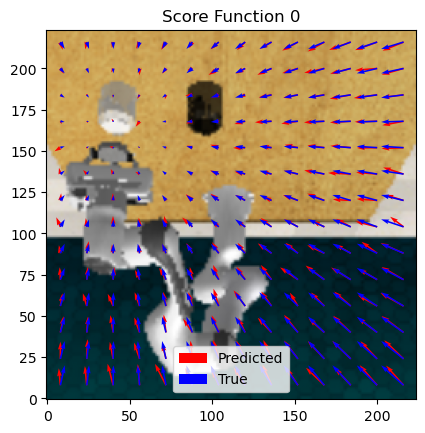

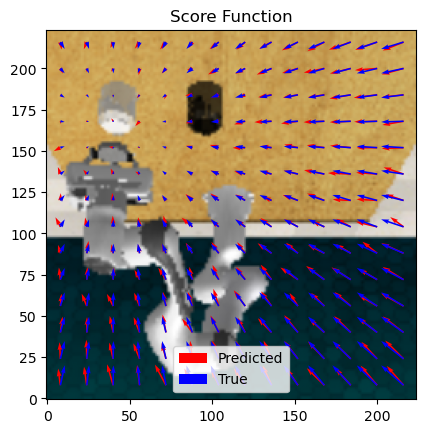

In [102]:
train_2(demos[:1], epochs=10)